In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [8]:
correct_sample  = [] 
with open('FullCorrectPredictedSample.txt', 'r') as f:
    correct_sample  = f.readlines()

In [12]:
correct_sample_ = []
for ele in correct_sample:
    correct_sample_.append(ele[:-1])


In [56]:
len(correct_sample_)

64

In [14]:
highspe_sample  = [] 
with open('HighSpePredictectedSamples.txt', 'r') as f:
    highspe_sample  = f.readlines()
highspe_sample_ = []
for ele in highspe_sample:
    highspe_sample_.append(ele[:-1])

In [16]:
Train2SamplesAll = os.listdir('models/research/deeplab/datasets/TumorDetection/dataset/JPEGImages')

In [23]:
sample_train2 = []
for ele in Train2SamplesAll:
    csample = ele.split('_')[0]
    if csample not in sample_train2 and csample.find('TNE') != -1:
        sample_train2.append(csample)

In [39]:
TestSamplesAll = os.listdir('Data/TestImages')

In [47]:

sample_test = []
for ele in TestSamplesAll:
    csample = ele.split('.')[0]
    if csample not in sample_test and csample.find('TNE') != -1:
        sample_test.append(csample)

In [50]:
InterTrainVal = set(sample_test).intersection(set(sample_train2))

In [53]:
len(InterTrainVal)

25

In [52]:
set(highspe_sample_).intersection(set(InterTrainVal))

{'TNE0232', 'TNE1420', 'TNE1425'}

In [54]:
set(correct_sample_).intersection(set(InterTrainVal))

{'TNE0006',
 'TNE0071',
 'TNE0232',
 'TNE0798',
 'TNE0866',
 'TNE0886',
 'TNE0890',
 'TNE1001',
 'TNE1002',
 'TNE1080',
 'TNE1082',
 'TNE1084',
 'TNE1418',
 'TNE1426',
 'TNE1433',
 'TNE1458',
 'TNE2097',
 'TNE2117',
 'TNE2155'}

In [55]:
len(set(correct_sample_).intersection(set(InterTrainVal)))

19

In [58]:
TestOnly = set(sample_test)- set(sample_train2)

In [59]:
len(TestOnly)

284

In [61]:
len(set(TestOnly).intersection(set(correct_sample_)))

45

In [62]:
len(set(TestOnly).intersection(set(highspe_sample_)))

84

In [66]:
84 / 284

0.29577464788732394

In [63]:
len(set(TestOnly).intersection(set(highspe_sample_).union(set(correct_sample_))))

129

In [64]:
129 / 284

0.45422535211267606

In [ ]:
TestPredTNE1426 = os.listdir('Data/TestImgPredictionTraining2/TNE1426')
TumorColor = (0,255,255)
NoTumorColor = (192,192,192)
BackgroundColor = (0,0,0)

In [ ]:
 rows = int(math.ceil(len(images) / cols))
    fig = plt.figure()
    fig.set_size_inches(cols * 3, rows * 3)
    for i, (image, title) in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.axis('off')
        plt.imshow(image.astype("uint8"))
        plt.title(title)

In [93]:
TumorMat = np.ones((512,512,3), dtype=np.uint8) 
TumorMat[:,:,0] = 0
TumorMat[:,:,1] = 255
TumorMat[:,:,2] = 255


NoTumorMat = np.ones((512,512,3), dtype=np.uint8) 
NoTumorMat[:,:,0] = 192
NoTumorMat[:,:,1] = 192
NoTumorMat[:,:,2] = 192


BackgroundMat = np.ones((512,512,3), dtype=np.uint8) 
BackgroundMat[:,:,0] = 255
BackgroundMat[:,:,1] = 255
BackgroundMat[:,:,2] = 255


im = cv2.imread('Data/TestImgPredictionTraining2/TNE1426/segmentation/TNE1426_1536_14336-segmap.jpg')
masknorm = np.zeros((im.shape))
dT = np.abs(np.sum(im.astype('int8')  - TumorMat.astype('int8') , axis = 2))
dNT = np.abs(np.sum(im.astype('int8')  - NoTumorMat.astype('int8') , axis = 2))
dB = np.abs(np.sum(im.astype('int8')  - BackgroundMat.astype('int8') , axis = 2))
diff_mat = np.zeros((im.shape))
diff_mat[:,:,0] = dT
diff_mat[:,:,1] = dNT
diff_mat[:,:,2] = dB
arr2dINDEX = np.argmin(diff_mat, axis = 2)

masknormOri = np.ones((im.shape))
masknormT = np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)) ,
                         (np.array(arr2dINDEX == 0)*1)),np.transpose(TumorMat,axes=(2,0,1)))
masknormNT =  np.multiply(np.multiply( np.transpose(masknormOri, axes=(2,0,1)), 
                         (np.array(arr2dINDEX == 1)*1)), np.transpose(NoTumorMat,axes=(2,0,1)))

masknormB =  np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)), 
                         (np.array(arr2dINDEX == 2)*1)), np.transpose(BackgroundMat, axes=(2,0,1)))
masknorm = masknormT + masknormNT + masknormB
masknorm = np.transpose(masknorm, axes=(1,2,0))




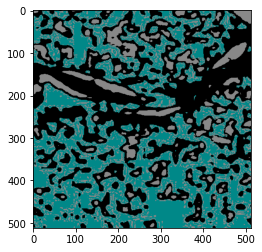

In [94]:
masknorm_m = masknorm*120

plt.imshow(masknorm_m.astype('uint8'))

In [108]:
# Tumor
np.sum(masknorm[:,:, 0] == 0) / (512**2)

0.36354827880859375

In [107]:
(512**2)

262144

In [109]:
# BackGround
np.sum(masknorm[:,:, 0] == 255) / (512**2)

0.22611618041992188

In [110]:
# Np tumor 
np.sum(masknorm[:,:, 0] == 192) / (512**2)

0.4103355407714844

In [ ]:
######################################
#  Generalization
######################################

In [113]:
TumorMat = np.ones((512,512,3), dtype=np.uint8) 
TumorMat[:,:,0] = 0
TumorMat[:,:,1] = 255
TumorMat[:,:,2] = 255


NoTumorMat = np.ones((512,512,3), dtype=np.uint8) 
NoTumorMat[:,:,0] = 192
NoTumorMat[:,:,1] = 192
NoTumorMat[:,:,2] = 192


BackgroundMat = np.ones((512,512,3), dtype=np.uint8) 
BackgroundMat[:,:,0] = 255
BackgroundMat[:,:,1] = 255
BackgroundMat[:,:,2] = 255

list_imgs = os.listdir('Data/TestImgPredictionTraining2/TNE1426/segmentation')
rows = len(list_imgs)
cols = 1
fig = plt.figure()
fig.set_size_inches(cols * 3, rows * 3)
i = 0 
for imname in list_imgs:
    im = cv2.imread(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))
    masknorm = np.zeros((im.shape))
    dT = np.abs(np.sum(im.astype('int8')  - TumorMat.astype('int8') , axis = 2))
    dNT = np.abs(np.sum(im.astype('int8')  - NoTumorMat.astype('int8') , axis = 2))
    dB = np.abs(np.sum(im.astype('int8')  - BackgroundMat.astype('int8') , axis = 2))
    diff_mat = np.zeros((im.shape))
    diff_mat[:,:,0] = dT
    diff_mat[:,:,1] = dNT
    diff_mat[:,:,2] = dB
    arr2dINDEX = np.argmin(diff_mat, axis = 2)

    masknormOri = np.ones((im.shape))
    masknormT = np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)) ,
                             (np.array(arr2dINDEX == 0)*1)),np.transpose(TumorMat,axes=(2,0,1)))
    masknormNT =  np.multiply(np.multiply( np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 1)*1)), np.transpose(NoTumorMat,axes=(2,0,1)))

    masknormB =  np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 2)*1)), np.transpose(BackgroundMat, axes=(2,0,1)))
    masknorm = masknormT + masknormNT + masknormB
    masknorm = np.transpose(masknorm, axes=(1,2,0))
    pTumor = np.sum(masknorm[:,:, 0] == 0) / (512**2)
    pBackground = np.sum(masknorm[:,:, 0] == 255) / (512**2)
    pNoTumor = np.sum(masknorm[:,:, 0] == 192) / (512**2)
    print('pTumor ', pTumor)
    print('pBackground ', pBackground)
    print('pNoTumor ', pNoTumor)
    title = "T{},NT{},B{}".format(pTumor,pNoTumor,pBackground  )
    plt.subplot(rows, cols, i + 1)
    plt.axis('off')
    plt.imshow(im.astype("uint8"))
    plt.title(title)
    i += 1


pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9993820190429688
pNoTumor  0.00061798095703125
pTumor  0.0
pBackground  0.9999275207519531
pNoTumor  7.2479248046875e-05
pTumor  0.0
pBackground  0.9999809265136719
pNoTumor  1.9073486328125e-05
pTumor  0.0
pBackground  0.9999275207519531
pNoTumor  7.2479248046875e-05
pTumor  0.0
pBackground  0.9997711181640625
pNoTumor  0.0002288818359375
pTumor  0.0
pBackground  0.9914932250976562
pNoTumor  0.00850677490234375
pTumor  0.0
pBackground  0.9999504089355469
pNoTumor  4.9591064453125e-05
pTumor  0.0
pBackground  0.9998512268066406
pNoTumor  0.000148773193359375
pTumor  0.0
pBackground  0.9998703002929688
pNoTumor  0.00012969970703125
pTumor  0.0
pBackground  0.99957275390625
pNoTumor  0.00042724609375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9996261596679688
pNoTumor  0.00037384033203125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998016357421875
pNoTumor  0.000198

pTumor  0.0
pBackground  0.998443603515625
pNoTumor  0.001556396484375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9999313354492188
pNoTumor  6.866455078125e-05
pTumor  0.0
pBackground  0.9999542236328125
pNoTumor  4.57763671875e-05
pTumor  0.0
pBackground  0.9998779296875
pNoTumor  0.0001220703125
pTumor  0.0
pBackground  0.9999885559082031
pNoTumor  1.1444091796875e-05
pTumor  0.0
pBackground  0.9999351501464844
pNoTumor  6.4849853515625e-05
pTumor  0.0
pBackground  0.9999198913574219
pNoTumor  8.0108642578125e-05
pTumor  0.0
pBackground  0.9992866516113281
pNoTumor  0.000713348388671875
pTumor  0.0
pBackground  0.9999809265136719
pNoTumor  1.9073486328125e-05
pTumor  0.0
pBackground  0.9998970031738281
pNoTumor  0.000102996826171875
pTumor  0.0
pBackground  0.9655036926269531
pNoTumor  0.034496307373046875
pTumor  0.0
pBackground  0.564208984375
pNoTumor  0.435791015625
pTumor  0.0
pBackground  0.2644920349121094
p

pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.00057220458984375
pBackground  0.9883384704589844
pNoTumor  0.011089324951171875
pTumor  0.0
pBackground  0.9989242553710938
pNoTumor  0.00107574462890625
pTumor  0.0
pBackground  0.9985427856445312
pNoTumor  0.00145721435546875
pTumor  0.0
pBackground  0.99871826171875
pNoTumor  0.00128173828125
pTumor  0.0
pBackground  0.999176025390625
pNoTumor  0.000823974609375
pTumor  0.0
pBackground  0.9235420227050781
pNoTumor  0.07645797729492188
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9987831115722656
pNoTumor  0.001216888427734375
pTumor  0.0
pBackground  0.7780990600585938
pNoTumor  0.22190093994140625
pTumor  0.0
pBackground  0.4511070251464844
pNoTumor  0.5488929748535156
pTumor  0.01644897460937

pTumor  0.8012428283691406
pBackground  0.096405029296875
pNoTumor  0.10235214233398438
pTumor  0.6538963317871094
pBackground  0.1451568603515625
pNoTumor  0.20094680786132812
pTumor  0.5888938903808594
pBackground  0.15896224975585938
pNoTumor  0.25214385986328125
pTumor  0.5517616271972656
pBackground  0.18065261840820312
pNoTumor  0.26758575439453125
pTumor  0.4990653991699219
pBackground  0.19250106811523438
pNoTumor  0.30843353271484375
pTumor  0.5860633850097656
pBackground  0.18004989624023438
pNoTumor  0.23388671875
pTumor  0.06594085693359375
pBackground  0.8886604309082031
pNoTumor  0.045398712158203125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9999351501464844
pNoTumor  6.4849853515625e-05
pTu

pTumor  0.0416412353515625
pBackground  0.090789794921875
pNoTumor  0.8675689697265625
pTumor  0.3059654235839844
pBackground  0.20692825317382812
pNoTumor  0.4871063232421875
pTumor  0.376007080078125
pBackground  0.17719650268554688
pNoTumor  0.4467964172363281
pTumor  0.45464324951171875
pBackground  0.19596099853515625
pNoTumor  0.349395751953125
pTumor  0.5383186340332031
pBackground  0.1683807373046875
pNoTumor  0.2933006286621094
pTumor  0.6061515808105469
pBackground  0.14890289306640625
pNoTumor  0.24494552612304688
pTumor  0.6844978332519531
pBackground  0.13289260864257812
pNoTumor  0.18260955810546875
pTumor  0.6226997375488281
pBackground  0.1353302001953125
pNoTumor  0.24197006225585938
pTumor  0.6756973266601562
pBackground  0.13246917724609375
pNoTumor  0.19183349609375
pTumor  0.7889251708984375
pBackground  0.10594940185546875
pNoTumor  0.10512542724609375
pTumor  0.6341552734375
pBackground  0.14399337768554688
pNoTumor  0.22185134887695312
pTumor  0.5450553894042969

pTumor  0.0
pBackground  0.4333648681640625
pNoTumor  0.5666351318359375
pTumor  0.0
pBackground  0.4495391845703125
pNoTumor  0.5504608154296875
pTumor  0.0
pBackground  0.5504684448242188
pNoTumor  0.44953155517578125
pTumor  0.0
pBackground  0.44765472412109375
pNoTumor  0.5523452758789062
pTumor  0.0
pBackground  0.4193382263183594
pNoTumor  0.5806617736816406
pTumor  0.0
pBackground  0.15436172485351562
pNoTumor  0.8456382751464844
pTumor  0.0
pBackground  0.14597320556640625
pNoTumor  0.8540267944335938
pTumor  0.0
pBackground  0.142822265625
pNoTumor  0.857177734375
pTumor  0.0
pBackground  0.16724777221679688
pNoTumor  0.8327522277832031
pTumor  0.071136474609375
pBackground  0.11769485473632812
pNoTumor  0.8111686706542969
pTumor  0.36629486083984375
pBackground  0.2246551513671875
pNoTumor  0.40904998779296875
pTumor  0.4453163146972656
pBackground  0.18465805053710938
pNoTumor  0.370025634765625
pTumor  0.42186737060546875
pBackground  0.18684768676757812
pNoTumor  0.3912849

pTumor  0.00016021728515625
pBackground  0.9957618713378906
pNoTumor  0.004077911376953125
pTumor  0.0
pBackground  0.9995574951171875
pNoTumor  0.0004425048828125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998397827148438
pNoTumor  0.00016021728515625
pTumor  0.0
pBackground  0.9996490478515625
pNoTumor  0.0003509521484375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9992828369140625
pNoTumor  0.0007171630859375
pTumor  0.0
pBackground  0.9836463928222656
pNoTumor  0.016353607177734375
pTumor  0.0
pBackground  0.43840789794921875
pNoTumor  0.5615921020507812
pTumor  0.0
pBackground  0.495086669921875
pNoTumor  0.504913330078125
pTumor  0.0
pBackground  0.4965095520019531
pNoTumor  0.5034904479980469
pTumor  0.0
pBackgroun

pTumor  0.45178985595703125
pBackground  0.18175125122070312
pNoTumor  0.3664588928222656
pTumor  0.5051078796386719
pBackground  0.17431259155273438
pNoTumor  0.32057952880859375
pTumor  0.5517387390136719
pBackground  0.16286087036132812
pNoTumor  0.285400390625
pTumor  0.5242538452148438
pBackground  0.16782760620117188
pNoTumor  0.3079185485839844
pTumor  0.4017333984375
pBackground  0.17564010620117188
pNoTumor  0.4226264953613281
pTumor  0.3498954772949219
pBackground  0.168548583984375
pNoTumor  0.4815559387207031
pTumor  0.210052490234375
pBackground  0.15340423583984375
pNoTumor  0.6365432739257812
pTumor  0.2600212097167969
pBackground  0.20491790771484375
pNoTumor  0.5350608825683594
pTumor  0.2934150695800781
pBackground  0.21773147583007812
pNoTumor  0.48885345458984375
pTumor  0.1061859130859375
pBackground  0.7399368286132812
pNoTumor  0.15387725830078125
pTumor  0.0
pBackground  0.9981346130371094
pNoTumor  0.001865386962890625
pTumor  0.0
pBackground  0.998573303222656

pTumor  0.22963714599609375
pBackground  0.18169021606445312
pNoTumor  0.5886726379394531
pTumor  0.3250160217285156
pBackground  0.2136993408203125
pNoTumor  0.4612846374511719
pTumor  0.3489189147949219
pBackground  0.1829681396484375
pNoTumor  0.4681129455566406
pTumor  0.3205604553222656
pBackground  0.16389846801757812
pNoTumor  0.5155410766601562
pTumor  0.30904388427734375
pBackground  0.17006301879882812
pNoTumor  0.5208930969238281
pTumor  0.2192840576171875
pBackground  0.14597702026367188
pNoTumor  0.6347389221191406
pTumor  0.13379669189453125
pBackground  0.16121673583984375
pNoTumor  0.704986572265625
pTumor  0.06508636474609375
pBackground  0.5175590515136719
pNoTumor  0.4173545837402344
pTumor  0.12860107421875
pBackground  0.4740638732910156
pNoTumor  0.3973350524902344
pTumor  0.3120765686035156
pBackground  0.21632003784179688
pNoTumor  0.4716033935546875
pTumor  0.28462982177734375
pBackground  0.19941329956054688
pNoTumor  0.5159568786621094
pTumor  0.2539291381835

pTumor  0.0
pBackground  0.9979896545410156
pNoTumor  0.002010345458984375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9996719360351562
pNoTumor  0.00032806396484375
pTumor  0.0
pBackground  0.656097412109375
pNoTumor  0.343902587890625
pTumor  0.0
pBackground  0.5691299438476562
pNoTumor  0.43087005615234375
pTumor  0.0
pBackground  0.5376815795898438
pNoTumor  0.46231842041015625
pTumor  0.0
pBackground  0.6248283386230469
pNoTumor  0.3751716613769531
pTumor  0.0
pBackground  0.6560211181640625
pNoTumor  0.3439788818359375
pTumor  0.003223419189453125
pBackground  0.4616203308105469
pNoTumor  0.53515625
pTumor  0.014659881591796875
pBackground  0.5168609619140625
pNoTumor  0.4684791564941406
pTumor  0.0
pBackground  0.253387451171875
pNoTumor  0.746612548828125
pTumor  0.0
pBackground  0.3887176513671875
pNoTumor  0.611282348632812

pTumor  0.6393661499023438
pBackground  0.14986038208007812
pNoTumor  0.21077346801757812
pTumor  0.5714035034179688
pBackground  0.23549270629882812
pNoTumor  0.19310379028320312
pTumor  0.002132415771484375
pBackground  0.9861602783203125
pNoTumor  0.011707305908203125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9993019104003906
pNoTumor  0.000698089599609375
pTumor  0.0
pBackground  0.9971199035644531
pNoTumor  0.002880096435546875
pTumor  0.0
pBackground  0.9977569580078125
pNoTumor  0.0022430419921875
pTumor  0.0
pBackground  0.9994354248046875
pNoTumor  0.0005645751953125
pTumor  0.0
pBackground  0.9949760437011719
pNoTumor  0.005023956298828125
pTumor  0.0
pBackground  0.9996376037597656
pNoTumor  0.000362396240234375
pTumor  0.0
pBackground  0.9998817443847656
pNoTumor  0.000118255615234375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTum

pTumor  0.16842269897460938
pBackground  0.155670166015625
pNoTumor  0.6759071350097656
pTumor  0.1849212646484375
pBackground  0.19884109497070312
pNoTumor  0.6162376403808594
pTumor  0.2820587158203125
pBackground  0.17196273803710938
pNoTumor  0.5459785461425781
pTumor  0.4215278625488281
pBackground  0.16139602661132812
pNoTumor  0.41707611083984375
pTumor  0.4850959777832031
pBackground  0.15761566162109375
pNoTumor  0.3572883605957031
pTumor  0.4651451110839844
pBackground  0.16573333740234375
pNoTumor  0.3691215515136719
pTumor  0.3984642028808594
pBackground  0.165069580078125
pNoTumor  0.4364662170410156
pTumor  0.37279510498046875
pBackground  0.16714096069335938
pNoTumor  0.4600639343261719
pTumor  0.3206024169921875
pBackground  0.19183349609375
pNoTumor  0.4875640869140625
pTumor  0.3170814514160156
pBackground  0.3611602783203125
pNoTumor  0.3217582702636719
pTumor  0.18619155883789062
pBackground  0.5380439758300781
pNoTumor  0.27576446533203125
pTumor  0.0
pBackground  

pTumor  0.00148773193359375
pBackground  0.2534942626953125
pNoTumor  0.7450180053710938
pTumor  0.009822845458984375
pBackground  0.5024757385253906
pNoTumor  0.487701416015625
pTumor  0.2377166748046875
pBackground  0.1652984619140625
pNoTumor  0.59698486328125
pTumor  0.3369483947753906
pBackground  0.16660690307617188
pNoTumor  0.4964447021484375
pTumor  0.3784675598144531
pBackground  0.15430831909179688
pNoTumor  0.46722412109375
pTumor  0.27867889404296875
pBackground  0.16392135620117188
pNoTumor  0.5573997497558594
pTumor  0.221160888671875
pBackground  0.14216995239257812
pNoTumor  0.6366691589355469
pTumor  0.23250579833984375
pBackground  0.1531982421875
pNoTumor  0.6142959594726562
pTumor  0.28229522705078125
pBackground  0.14248275756835938
pNoTumor  0.5752220153808594
pTumor  0.3017311096191406
pBackground  0.13477325439453125
pNoTumor  0.5634956359863281
pTumor  0.3257865905761719
pBackground  0.14530181884765625
pNoTumor  0.5289115905761719
pTumor  0.3973655700683594
p

pTumor  0.0
pBackground  0.5797080993652344
pNoTumor  0.4202919006347656
pTumor  0.0
pBackground  0.4881019592285156
pNoTumor  0.5118980407714844
pTumor  0.0
pBackground  0.4217491149902344
pNoTumor  0.5782508850097656
pTumor  0.03081512451171875
pBackground  0.4045829772949219
pNoTumor  0.5646018981933594
pTumor  0.0368499755859375
pBackground  0.33914947509765625
pNoTumor  0.6240005493164062
pTumor  0.3212928771972656
pBackground  0.2779502868652344
pNoTumor  0.4007568359375
pTumor  0.3445472717285156
pBackground  0.18058395385742188
pNoTumor  0.4748687744140625
pTumor  0.3502540588378906
pBackground  0.18253326416015625
pNoTumor  0.4672126770019531
pTumor  0.406005859375
pBackground  0.17515945434570312
pNoTumor  0.4188346862792969
pTumor  0.4841156005859375
pBackground  0.166107177734375
pNoTumor  0.3497772216796875
pTumor  0.43050384521484375
pBackground  0.15424728393554688
pNoTumor  0.4152488708496094
pTumor  0.37592315673828125
pBackground  0.152008056640625
pNoTumor  0.4720687

pTumor  0.0
pBackground  0.9993247985839844
pNoTumor  0.000675201416015625
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998016357421875
pNoTumor  0.0001983642578125
pTumor  0.0
pBackground  0.9999046325683594
pNoTumor  9.5367431640625e-05
pTumor  0.0
pBackground  0.9993133544921875
pNoTumor  0.0006866455078125
pTumor  0.0
pBackground  0.9904708862304688
pNoTumor  0.00952911376953125
pTumor  0.0
pBackground  0.4799690246582031
pNoTumor  0.5200309753417969
pTumor  0.0
pBackground  0.6497573852539062
pNoTumor  0.35024261474609375
pTumor  0.0
pBackground  0.6266288757324219
pNoTumor  0.3733711242675781
pTumor  0.028148651123046875
pBackground  0.22705841064453125
pNoTumor  0.7447929382324219
pTumor  0.07367706298828125
pBackground  0.7334251403808594
pNoTumor  0.19289779663085938
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.14758682250976562
pBackground  0.5317192077636719
pNoTumor  0.3206939697265625
pTumor  0.39456939697265625
pBackground  0.178291320800

pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9991416931152344
pNoTumor  0.000858306884765625
pTumor  0.0
pBackground  0.9992942810058594
pNoTumor  0.000705718994140625
pTumor  0.0
pBackground  0.9998550415039062
pNoTumor  0.00014495849609375
pTumor  0.0
pBackground  0.9998283386230469
pNoTumor  0.000171661376953125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9999885559082031
pNoTumor  1.1444091796875e-05
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.6277313232421875
pNoTumor  0.3722686767578125
pTumor  0.089996337890625
pBackground  0.19778060913085938
pNoTumor  0.7122230529785156
pTumor  0.0
pBackground  0.8694381713867188
pNoTumor  0.13056182861328125
pTumor  0.0
pBackground  0.9808731079101562
pNoTumor  0.01912689208984375
pTumor  0.0
pBackground  0.9989356994628906
pNoTumor  0.001064300537109375
pTumor  0.0
pBackground  0.9

pTumor  0.0
pBackground  0.9997138977050781
pNoTumor  0.000286102294921875
pTumor  0.0
pBackground  0.9904708862304688
pNoTumor  0.00952911376953125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9972267150878906
pNoTumor  0.002773284912109375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998626708984375
pNoTumor  0.0001373291015625
pTumor  0.0
pBackground  0.9998092651367188
pNoTumor  0.00019073486328125
pTumor  0.0
pBackground  0.9998321533203125
pNoTumor  0.0001678466796875
pTumor  0.0
pBackground  0.9998092651367188
pNoTumor  0.00019073486328125
pTumor  0.0
pBackground  0.9976806640625
pNoTumor  0.0023193359375
pTumor  0.0
pBackground  0.9984817504882812
pNoTumor  0.00151824951171875
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9977035522460938
pNoTumor  0.00229644775390625
pTumor  0.089019775390625
pBackground  0.81884765625

pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0

ValueError: Image size of 216x469368 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 216x469368 with 2173 Axes>

In [ ]:
#####################################
# Decision 
#####################################

In [2]:
TumorMat = np.ones((512,512,3), dtype=np.uint8) 
TumorMat[:,:,0] = 0
TumorMat[:,:,1] = 255
TumorMat[:,:,2] = 255


NoTumorMat = np.ones((512,512,3), dtype=np.uint8) 
NoTumorMat[:,:,0] = 192
NoTumorMat[:,:,1] = 192
NoTumorMat[:,:,2] = 192


BackgroundMat = np.ones((512,512,3), dtype=np.uint8) 
BackgroundMat[:,:,0] = 255
BackgroundMat[:,:,1] = 255
BackgroundMat[:,:,2] = 255

list_imgs = os.listdir('Data/TestImgPredictionTraining2/TNE1426/segmentation')
rows = len(list_imgs)
cols = 1
fig = plt.figure()
fig.set_size_inches(cols * 3, rows * 3)
i = 0 
acc_tiles_fjpeg_list = []
reject_tiles_fjpeg_list = []
for imname in list_imgs:
    im = cv2.imread(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))
    masknorm = np.zeros((im.shape))
    dT = np.abs(np.sum(im.astype('int8')  - TumorMat.astype('int8') , axis = 2))
    dNT = np.abs(np.sum(im.astype('int8')  - NoTumorMat.astype('int8') , axis = 2))
    dB = np.abs(np.sum(im.astype('int8')  - BackgroundMat.astype('int8') , axis = 2))
    diff_mat = np.zeros((im.shape))
    diff_mat[:,:,0] = dT
    diff_mat[:,:,1] = dNT
    diff_mat[:,:,2] = dB
    arr2dINDEX = np.argmin(diff_mat, axis = 2)

    masknormOri = np.ones((im.shape))
    masknormT = np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)) ,
                             (np.array(arr2dINDEX == 0)*1)),np.transpose(TumorMat,axes=(2,0,1)))
    masknormNT =  np.multiply(np.multiply( np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 1)*1)), np.transpose(NoTumorMat,axes=(2,0,1)))

    masknormB =  np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 2)*1)), np.transpose(BackgroundMat, axes=(2,0,1)))
    masknorm = masknormT + masknormNT + masknormB
    masknorm = np.transpose(masknorm, axes=(1,2,0))
    pTumor = np.sum(masknorm[:,:, 0] == 0) / (512**2)
    pBackground = np.sum(masknorm[:,:, 0] == 255) / (512**2)
    pNoTumor = np.sum(masknorm[:,:, 0] == 192) / (512**2)
    if pBackground < 0.5 and pTumor > pNoTumor:
        acc_tiles_fjpeg_list.append(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))
    else:
        reject_tiles_fjpeg_list.append(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))



<Figure size 216x469368 with 0 Axes>

In [3]:
len(acc_tiles_fjpeg_list)

257

In [4]:
len(reject_tiles_fjpeg_list)

1916

In [ ]:
########################################
# Move original tiles
#########################################

In [105]:
C_sample_main_tiles = os.listdir('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426')

In [106]:
C_sample_main_tiles_acc = os.listdir('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept')

In [107]:
Tiles_acc = []
for ele in C_sample_main_tiles_acc:
    Tiles_acc.append((os.path.join('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept',  
                              ele), ele))


In [108]:
C_sample_main_tiles_reject =  os.listdir('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject')

In [109]:
Tiles_rej = []
for ele in C_sample_main_tiles_reject:
    Tiles_rej.append((os.path.join('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject',  
                              ele), ele))


In [110]:
Tiles_acc

[('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_11089_37885.jpg',
  'TNE1426_11089_37885.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_55441.jpg',
  'TNE1426_23101_55441.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_48973.jpg',
  'TNE1426_49897_48973.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_60061_49897.jpg',
  'TNE1426_60061_49897.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_44353.jpg',
  'TNE1426_33265_44353.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_56365_23101.jpg',
  'TNE1426_56365_23101.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_72073_40657.

In [111]:
FullTilesList = Tiles_acc + Tiles_rej

In [112]:
import pandas as pd
df_tiles_list = pd.DataFrame()
xOri = []
yOri = []
Fpath =  []
TilesName = []
for ele in FullTilesList:
    xo  = int(ele[1].split('_')[1])
    yo = int(ele[1].split('_')[2].split('.')[0])
    xOri.append(xo)
    yOri.append(yo)
    TilesName.append(ele[1])
    Fpath.append(ele[0])
df_tiles_list['xOri'] = xOri
df_tiles_list['yOri'] = yOri
df_tiles_list['TilesName'] = TilesName
df_tiles_list['Fpath'] = Fpath

In [113]:
df_tiles_list  =  df_tiles_list.sort_values(['xOri', 'yOri'], ascending = [True, True])

In [153]:
max(xOri)

95173

In [156]:
max(yOri)

73921

In [155]:
95173 / 26379

3.607907805451306

In [157]:
73921 / 20459

3.613128696417225

In [152]:
path_acc_tiles = []
for p in acc_tiles_fjpeg_list:
    x = int(p.split('/')[-1].split('_')[1])
    x8 = x * 3.6
    y = int(p.split('/')[-1].split('_')[2].split('-')[0])
    y8 = x * 3.6
    xp512 = x + 512
    x8p512  = xp512 * 3.6
    yp512 = y + 512
    y8p512  = yp512 * 3.6
    sub_df = df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                        &  (df_tiles_list['xOri'] > x8) \
                       & (df_tiles_list['yOri'] < y8p512) \
                       &  (df_tiles_list['yOri'] > y8)  ] 
    for i in range(sub_df.shape[0]):
        path_acc_tiles.append(sub_df.iloc[i,3])

In [142]:
path_rej_tiles = []
for p in reject_tiles_fjpeg_list:
    x = int(p.split('/')[-1].split('_')[1])
    x8 = x * 3.6
    y = int(p.split('/')[-1].split('_')[2].split('-')[0])
    y8 = x * 3.6
    xp512 = x + 512
    x8p512  = xp512 * 3.6
    yp512 = y + 512
    y8p512  = yp512 * 3.6
    sub_df = df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                        &  (df_tiles_list['xOri'] > x8) \
                       & (df_tiles_list['yOri'] < y8p512) \
                       &  (df_tiles_list['yOri'] > y8)  ] 
    for i in range(sub_df.shape[0]):
        path_rej_tiles.append(sub_df.iloc[i,3])

In [144]:
try:
    os.mkdir('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2')
except:
    print('done')
try:
    os.mkdir(os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426'))
except: 
    print('Done')
try:
    os.mkdir(os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'accept'))
except: 
    print('Done')
try:
    os.mkdir(os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'reject'))
except: 
    print('Done')

In [149]:
import shutil
for ele in path_acc_tiles:
    print('ele ', ele)
    shutil.copy(ele,os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'accept', ele.split('/')[-1]) )
for ele in path_rej_tiles:
    shutil.copy(ele,os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'reject', ele.split('/')[-1]) )

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_14785.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_17557.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_22177.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_14785_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_14785_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_15709_19405.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_20329.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_15709_22177.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_15709_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_19405.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_16633.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_17557.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_20329_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_20329.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_16633_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_16633_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_22177.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_21253_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_21253_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_25873_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_24949_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_24949_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_24949_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_25873_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_34189_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_34189_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_33265_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_37885_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_37885_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_38809_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_38809_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_38809_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36961_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_44353_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_44353_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_44353_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_43429_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_43429_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48973_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48049_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48973_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48973_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_52669_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_52669_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_49897_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_55441_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_56365_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_55441_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_57289_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_57289_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_57289_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_57289_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_53593_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_54517_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_54517_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_56365_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_58213_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_58213_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_58213_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_66529_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_66529_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_67453_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_67453_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_67453_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_69301_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_69301_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_69301_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

In [150]:
path_rej_tiles

['/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_1_3697.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_925_925.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_1849_1.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_1849_2773.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_2773_1849.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_2773_3697.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_3697_1.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_3697_3697.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/

In [ ]:
#####################
# TEst
#####################

In [185]:
SegPath = 'Data/TestImgPredictionTraining2/TNE1426/overlay/TNE1426_9728_14848-overlay.jpg'

In [186]:
imO = cv2.imread(SegPath)
imO = cv2.cvtColor(imO, cv2.COLOR_BGR2RGB)

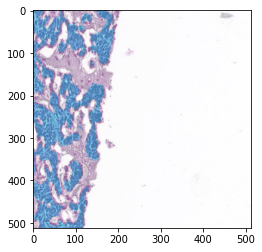

In [187]:
plt.imshow(imO)

In [202]:
p = SegPath
x = int(p.split('/')[-1].split('_')[1])
x8 = x * 3.6
print('x ', x, 'x8 ', x8)
y = int(p.split('/')[-1].split('_')[2].split('-')[0])
y8 = y * 3.6
print('y ', y, 'y8 ', y8)
xp512 = x + (512 )
x8p512  = xp512 * 3.6
print('xp512 ', xp512, 'x8p512 ', x8p512)

yp512 = y + (512)
y8p512  = yp512 * 3.6
print('yp512 ', yp512, 'y8p512 ', y8p512)

sub_df = df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                    &  (df_tiles_list['xOri'] > x8) \
                   & (df_tiles_list['yOri'] < y8p512) \
                   &  (df_tiles_list['yOri'] > y8)  ] 

x  9728 x8  35020.8
y  14848 y8  53452.8
xp512  10240 x8p512  36864.0
yp512  15360 y8p512  55296.0


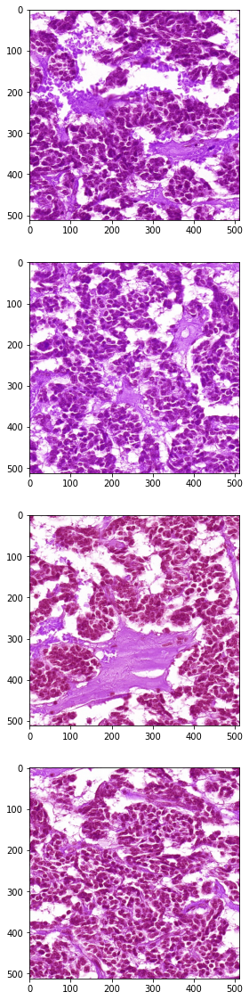

In [203]:
plt.figure(figsize = (19,20))
c = 1
for i in range(sub_df.shape[0]):
    cim = cv2.imread(sub_df.iloc[i,3])
    plt.subplot(sub_df.shape[0], 1, c)
    plt.imshow(cim)
    c += 1

In [201]:
list(sub_df.iloc[:,3])

['/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_53593.jpg']

In [172]:
5120 * 3.6

18432.0

In [173]:
8192 * 3.6

29491.2

In [91]:
for i in range(masknorm.shape[0]):
    for j in range(masknorm.shape[1]):
        print(masknorm[i,j,:])

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

In [75]:
TestSegmentation[0,0,:]

array([255, 255, 249], dtype=uint8)

In [76]:
TestSegmentation[130,130,:]

array([192, 196, 197], dtype=uint8)

In [73]:
TestSegmentation[150,150,:]

array([192, 192, 192], dtype=uint8)